# Análisis Exploratorio de Datos (EDA)

## Importamos librerías

In [1]:
from pathlib import Path 
import numpy as np 
import pandas as pd 
import pyarrow as pa
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import subprocess

## Load Data

In [2]:
DATA_DIR = Path.cwd()/ "data"

melbourne_df = pd.read_parquet(
    DATA_DIR / "02_intermediate/melbourne_type_fixed.parquet", engine="pyarrow"
)

In [3]:
melbourne_df.sample(10)

,Longtitude,BuildingArea,Type,SellerG,Distance,Landsize,Postcode,Date,Price,Bathroom,...,Regionname,Car,CouncilArea,Address,Method,Propertycount,Bedroom2,Lattitude,YearBuilt,Suburb
34814,144.57050,NaN,h,hockingstuart,31.7,NaN,3337.0,2017-11-11,428000.0,2,...,Western Victoria,2,Melton City Council,57 Rosina Dr,S,3600,3,-37.68570,<NA>,Melton
31246,144.99056,NaN,u,Peter,2.4,NaN,3121.0,2017-09-16,499000.0,<NA>,...,Northern Metropolitan,<NA>,Yarra City Council,105/18 Tanner St,S,14949,<NA>,-37.82309,<NA>,Richmond
793,NaN,NaN,u,Upside,5.0,NaN,3182.0,2018-03-03,640000.0,<NA>,...,Southern Metropolitan,<NA>,Port Phillip City Council,6/340 St Kilda Rd,S,13240,<NA>,NaN,<NA>,St Kilda
35435,145.29006,204.0,h,O'Brien,34.7,528.0,3977.0,2017-08-26,720008.0,3,...,South-Eastern Metropolitan,2,Casey City Council,48 Majestic Bvd,SP,7680,5,-38.08902,2006,Cranbourne
56152,145.09720,792.0,h,Fletchers,12.2,792.0,3147.0,2016-10-09,1365000.0,1,...,Southern Metropolitan,1,Monash City Council,35 Douglas St,S,2894,3,-37.86400,1950,Ashwood
48158,145.01980,NaN,h,Barry,11.2,695.0,3073.0,2016-11-27,1162000.0,3,...,Northern Metropolitan,4,Darebin City Council,24 Home St,S,21650,4,-37.72640,<NA>,Reservoir
41336,145.15484,118.0,h,Ray,13.4,NaN,3130.0,2017-08-19,1000000.0,1,...,Eastern Metropolitan,3,Whitehorse City Council,277 Blackburn Rd,S,4387,3,-37.84499,1960,Blackburn South
35315,NaN,NaN,h,Nicholas,38.0,NaN,3199.0,2017-06-24,1700000.0,<NA>,...,South-Eastern Metropolitan,<NA>,Frankston City Council,5 Somme Av,VB,17055,<NA>,NaN,<NA>,Frankston
16510,NaN,NaN,h,Jellis,5.7,NaN,3078.0,2017-09-23,1520000.0,<NA>,...,Northern Metropolitan,<NA>,Darebin City Council,15 Bank St,SP,2211,<NA>,NaN,<NA>,Alphington
27250,145.04938,0.0,h,Ray,14.3,580.0,3189.0,2017-08-26,1290000.0,1,...,Southern Metropolitan,1,Kingston City Council,7 Walsh Av,S,2555,3,-37.94492,1970,Moorabbin


In [4]:
melbourne_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57770 entries, 0 to 57769
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Longtitude     44562 non-null  float64       
 1   BuildingArea   22866 non-null  float64       
 2   Type           57768 non-null  category      
 3   SellerG        57768 non-null  category      
 4   Distance       57766 non-null  float64       
 5   Landsize       38207 non-null  float64       
 6   Postcode       57766 non-null  float64       
 7   Date           57768 non-null  datetime64[ns]
 8   Price          45189 non-null  float64       
 9   Bathroom       44143 non-null  Int64         
 10  Rooms          57768 non-null  Int64         
 11  Regionname     57764 non-null  category      
 12  Car            43293 non-null  Int64         
 13  CouncilArea    57764 non-null  category      
 14  Address        57768 non-null  category      
 15  Method         5776

In [5]:
cols_categoric = ["Type", "SellerG", "Regionname", "CouncilArea", "Method", "Suburb", "Address", "Postcode"]

# Obtener valores únicos por cada categoría y convertirlas a categóricas NO ordenadas
cat_cols = {col: melbourne_df[col].dropna().unique().tolist() for col in cols_categoric}

# Convertir las columnas a pandas.Categorical sin orden
for col, categories in cat_cols.items():
    melbourne_df[col] = pd.Categorical(melbourne_df[col], categories=categories, ordered=False)

# Verificar la conversión
for col in cols_categoric:
    print(f"Valores únicos en {col} ({len(cat_cols[col])}):")
    print(melbourne_df[col].cat.categories, "\n")

Valores únicos en Type (3):
Index(['h', 'u', 't'], dtype='object') 

Valores únicos en SellerG (363):
Index(['Buxton', 'hockingstuart', 'YPA', 'MICM', 'Raine', 'Jellis', 'Ray',
       'Nelson', 'Purplebricks', 'Biggin',
       ...
       'Malvern', 'Bustin', 'Tiernan's', 'T', 'Christou', 'Weston', 'Better',
       'A', 'Sweeney/Advantage', 'Sterling'],
      dtype='object', length=363) 

Valores únicos en Regionname (8):
Index(['Southern Metropolitan', 'Northern Metropolitan',
       'Western Metropolitan', 'Eastern Metropolitan',
       'South-Eastern Metropolitan', 'Eastern Victoria', 'Northern Victoria',
       'Western Victoria'],
      dtype='object') 

Valores únicos en CouncilArea (33):
Index(['Glen Eira City Council', 'Bayside City Council', 'Hume City Council',
       'Melbourne City Council', 'Wyndham City Council',
       'Boroondara City Council', 'Banyule City Council',
       'Kingston City Council', 'Moreland City Council',
       'Greater Dandenong City Council', 'Marib

In [6]:
melbourne_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57770 entries, 0 to 57769
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Longtitude     44562 non-null  float64       
 1   BuildingArea   22866 non-null  float64       
 2   Type           57768 non-null  category      
 3   SellerG        57768 non-null  category      
 4   Distance       57766 non-null  float64       
 5   Landsize       38207 non-null  float64       
 6   Postcode       57766 non-null  category      
 7   Date           57768 non-null  datetime64[ns]
 8   Price          45189 non-null  float64       
 9   Bathroom       44143 non-null  Int64         
 10  Rooms          57768 non-null  Int64         
 11  Regionname     57764 non-null  category      
 12  Car            43293 non-null  Int64         
 13  CouncilArea    57764 non-null  category      
 14  Address        57768 non-null  category      
 15  Method         5776

In [7]:
melbourne_df.shape

(57770, 21)

In [8]:
melbourne_df.sample(10)

,Longtitude,BuildingArea,Type,SellerG,Distance,Landsize,Postcode,Date,Price,Bathroom,...,Regionname,Car,CouncilArea,Address,Method,Propertycount,Bedroom2,Lattitude,YearBuilt,Suburb
25087,144.95379,NaN,t,Nick,1.8,37.0,3051.0,2017-06-17,780000.0,1,...,Northern Metropolitan,0,Melbourne City Council,141 Howard St,S,6821,1,-37.80376,<NA>,North Melbourne
11414,145.06270,260.0,h,Marshall,9.7,981.0,3103.0,2016-05-28,2450000.0,2,...,Southern Metropolitan,2,Boroondara City Council,12 Wills St,S,5682,4,-37.80580,1960,Balwyn
24955,145.02210,NaN,u,Walsh,4.6,0.0,3142.0,2016-08-22,857000.0,0,...,Southern Metropolitan,0,Stonnington City Council,1/183 Kooyong Rd,S,7217,2,-37.84580,<NA>,Toorak
34379,145.12462,134.0,h,Buxton,16.7,721.0,3168.0,2018-03-17,NaN,1,...,South-Eastern Metropolitan,1,Monash City Council,8 Prince St,PI,5837,3,-37.91637,1955,Clayton
20594,144.94520,116.0,t,Jellis,2.3,61.0,3051.0,2017-05-20,NaN,2,...,Northern Metropolitan,1,Melbourne City Council,1/118 Haines St,S,6821,3,-37.80290,2016,North Melbourne
54219,144.99569,NaN,h,Biggin,3.0,196.0,3067.0,2017-08-19,1000000.0,1,...,Northern Metropolitan,2,Yarra City Council,67 Stafford St,PI,4019,3,-37.80094,1900,Abbotsford
40990,NaN,NaN,u,Nelson,11.2,NaN,3046.0,2018-02-24,363000.0,<NA>,...,Northern Metropolitan,<NA>,Moreland City Council,2/37 Rhodes Pde,S,2651,<NA>,NaN,<NA>,Oak Park
6659,144.88276,NaN,t,Moonee,12.9,NaN,3043.0,2017-09-09,545000.0,2,...,Western Metropolitan,1,Brimbank City Council,18C Sharps Rd,S,3296,3,-37.70820,<NA>,Tullamarine
11398,NaN,NaN,h,RT,7.8,NaN,3124.0,2016-03-12,NaN,<NA>,...,Southern Metropolitan,<NA>,Boroondara City Council,38 Sunnyside Av,SN,8920,<NA>,NaN,<NA>,Camberwell
51303,145.10420,NaN,u,Woodards,12.2,72.0,3147.0,2016-06-18,535000.0,1,...,Southern Metropolitan,1,Monash City Council,4/24 Mulgrave St,S,2894,2,-37.87020,<NA>,Ashwood


In [9]:
melbourne_df.isnull().sum()

Longtitude       13208
BuildingArea     34904
Type                 2
SellerG              2
Distance             4
Landsize         19563
Postcode             4
Date                 2
Price            12581
Bathroom         13627
Rooms                2
Regionname           6
Car              14477
CouncilArea          6
Address              2
Method               2
Propertycount        6
Bedroom2         13615
Lattitude        13208
YearBuilt        31927
Suburb               2
dtype: int64

 Target Variable = Price

## Numerical variables

In [10]:
melbourne_df.describe()

,Longtitude,BuildingArea,Distance,Landsize,Date,Price,Bathroom,Rooms,Car,Propertycount,Bedroom2,Lattitude,YearBuilt
count,44562.000000,22866.000000,57766.000000,38207.000000,57768,4.518900e+04,44143.0,57768.0,43293.0,57764.0,44155.0,44562.000000,25843.0
mean,145.001234,157.499017,11.190472,603.218494,2017-05-17 14:25:21.063564544,1.054870e+06,1.62472,3.033877,1.729079,7576.249394,3.085132,-37.810628,1965.038966
min,144.431620,0.000000,0.000000,0.000000,2016-01-28 00:00:00,8.500000e+04,0.0,1.0,0.0,83.0,0.0,-38.190430,1196.0
25%,144.932500,102.000000,6.400000,225.000000,2016-11-19 00:00:00,6.370000e+05,1.0,2.0,1.0,4385.0,2.0,-37.862680,1940.0
50%,145.007100,136.000000,10.300000,523.000000,2017-06-24 00:00:00,8.750000e+05,2.0,3.0,2.0,6763.0,3.0,-37.807720,1970.0
75%,145.071670,188.000000,14.000000,670.000000,2017-10-28 00:00:00,1.300000e+06,2.0,4.0,2.0,10412.0,4.0,-37.754700,2000.0
max,145.526350,6791.000000,48.100000,433014.000000,2018-10-03 00:00:00,1.120000e+07,9.0,16.0,26.0,21650.0,20.0,-37.390200,2106.0
std,0.120494,146.181079,6.805107,3689.308931,NaN,6.466821e+05,0.721224,0.973222,1.012252,4420.219056,0.969118,0.090464,37.652234


## Categorical variables

In [11]:
melbourne_df.describe(include="category")

,Type,SellerG,Postcode,Regionname,CouncilArea,Address,Method,Suburb
count,57768,57768,57766.0,57764,57764,57768,57768,57768
unique,3,363,208.0,8,33,27304,9,347
top,h,Jellis,3073.0,Southern Metropolitan,Boroondara City Council,5 Charles St,S,Reservoir
freq,39806,5663,1381.0,19653,6192,8,32690,1381


In [12]:
REPORT_DIR = Path.cwd() / "reporte"
REPORT_DIR.mkdir(parents=True, exist_ok=True)
print(f"Carpeta creada en: {REPORT_DIR.resolve()}")
profile = ProfileReport(melbourne_df, title="Análisis Exploratorio de Melbourne Housing", explorative=True)
report_path = REPORT_DIR / "reporte.html"
profile.to_file(str(report_path))
print(f"Reporte guardado en: {report_path.resolve()}")

Carpeta creada en: /workspaces/CDP-Melbourne-houses/reporte


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Reporte guardado en: /workspaces/CDP-Melbourne-houses/reporte/reporte.html


In [13]:
profile.to_notebook_iframe()

In [14]:
nulos_df = (melbourne_df.isnull().sum() / len(melbourne_df) * 100).round(2)
nulos_df = pd.DataFrame({
    "Null count": melbourne_df.isnull().sum(),
    "Null %": nulos_df,
    "Dtype": melbourne_df.dtypes
})
print(nulos_df)

               Null count  Null %           Dtype
Longtitude          13208   22.86         float64
BuildingArea        34904   60.42         float64
Type                    2    0.00        category
SellerG                 2    0.00        category
Distance                4    0.01         float64
Landsize            19563   33.86         float64
Postcode                4    0.01        category
Date                    2    0.00  datetime64[ns]
Price               12581   21.78         float64
Bathroom            13627   23.59           Int64
Rooms                   2    0.00           Int64
Regionname              6    0.01        category
Car                 14477   25.06           Int64
CouncilArea             6    0.01        category
Address                 2    0.00        category
Method                  2    0.00        category
Propertycount           6    0.01           Int64
Bedroom2            13615   23.57           Int64
Lattitude           13208   22.86         float64


In [15]:
%matplotlib inline

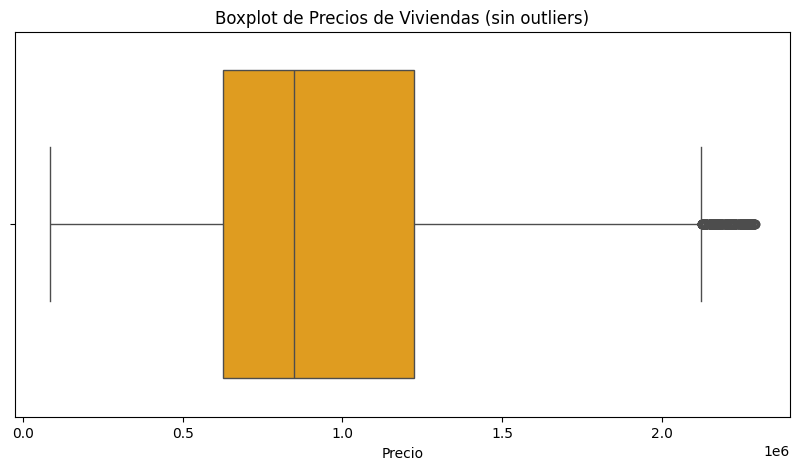

In [16]:
def remove_outliers_iqr(df, column, threshold=1.5):
    q1, q3 = df[column].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower_bound = q1 - threshold * iqr
    upper_bound = q3 + threshold * iqr
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Aplicar la función a 'Price'
melbourne_df_filtered = remove_outliers_iqr(melbourne_df, "Price")

# Graficar el boxplot sin outliers
plt.figure(figsize=(10, 5))
sns.boxplot(x=melbourne_df_filtered["Price"], color="orange")
plt.title("Boxplot de Precios de Viviendas (sin outliers)")
plt.xlabel("Precio")
plt.show()


In [17]:
melbourne_df.describe()

,Longtitude,BuildingArea,Distance,Landsize,Date,Price,Bathroom,Rooms,Car,Propertycount,Bedroom2,Lattitude,YearBuilt
count,44562.000000,22866.000000,57766.000000,38207.000000,57768,4.518900e+04,44143.0,57768.0,43293.0,57764.0,44155.0,44562.000000,25843.0
mean,145.001234,157.499017,11.190472,603.218494,2017-05-17 14:25:21.063564544,1.054870e+06,1.62472,3.033877,1.729079,7576.249394,3.085132,-37.810628,1965.038966
min,144.431620,0.000000,0.000000,0.000000,2016-01-28 00:00:00,8.500000e+04,0.0,1.0,0.0,83.0,0.0,-38.190430,1196.0
25%,144.932500,102.000000,6.400000,225.000000,2016-11-19 00:00:00,6.370000e+05,1.0,2.0,1.0,4385.0,2.0,-37.862680,1940.0
50%,145.007100,136.000000,10.300000,523.000000,2017-06-24 00:00:00,8.750000e+05,2.0,3.0,2.0,6763.0,3.0,-37.807720,1970.0
75%,145.071670,188.000000,14.000000,670.000000,2017-10-28 00:00:00,1.300000e+06,2.0,4.0,2.0,10412.0,4.0,-37.754700,2000.0
max,145.526350,6791.000000,48.100000,433014.000000,2018-10-03 00:00:00,1.120000e+07,9.0,16.0,26.0,21650.0,20.0,-37.390200,2106.0
std,0.120494,146.181079,6.805107,3689.308931,NaN,6.466821e+05,0.721224,0.973222,1.012252,4420.219056,0.969118,0.090464,37.652234


In [18]:
def analyze_categorical_distribution(df, cat_cols):
    """Analiza la distribución de variables categóricas."""
    
    results = {}
    for col in cat_cols:
        val_counts = df[col].value_counts()
        proportions = df[col].value_counts(normalize=True)
        
        n_unique = len(val_counts)
        mode = val_counts.idxmax()
        mode_percentage = proportions.iloc[0] * 100
        
        freq_array = val_counts.values
        freq_skew = (freq_array.mean() - np.median(freq_array)) / freq_array.std() if freq_array.std() != 0 else 0
        
        results[col] = {
            'Unique Values': n_unique,
            'Mode': mode,
            'Mode %': f"{mode_percentage:.2f}%",
            'Distribution Skew': f"{freq_skew:.2f}",
            'Value Counts': val_counts.to_dict()
        }
    
    return pd.DataFrame(results).T

cols_categoric = ["Type", "SellerG", "Regionname", "CouncilArea", "Method", "Suburb", "Address", "Postcode"]
categorical_analysis = analyze_categorical_distribution(melbourne_df, cols_categoric)
categorical_analysis


,Unique Values,Mode,Mode %,Distribution Skew,Value Counts
Type,3,h,68.91%,0.49,"{'h': 39806, 'u': 12062, 't': 5900}"
SellerG,363,Jellis,9.80%,0.24,"{'Jellis': 5663, 'Barry': 5321, 'Nelson': 5288..."
Regionname,8,Southern Metropolitan,34.02%,0.30,"{'Southern Metropolitan': 19653, 'Northern Met..."
CouncilArea,33,Boroondara City Council,10.72%,0.12,"{'Boroondara City Council': 6192, 'Darebin Cit..."
Method,9,S,56.59%,0.43,"{'S': 32690, 'SP': 8434, 'PI': 8057, 'VB': 518..."
Suburb,347,Reservoir,2.39%,0.36,"{'Reservoir': 1381, 'Bentleigh East': 962, 'Ri..."
Address,27304,5 Charles St,0.01%,0.29,"{'5 Charles St': 8, '57 Bay Rd': 7, '13 Robins..."
Postcode,208,3073.0,2.39%,0.28,"{3073.0: 1381, 3020.0: 1059, 3046.0: 1018, 312..."


In [19]:
def analyze_numerical_dist(df, num_cols):
    """Analiza la distribución de variables numéricas en un DataFrame."""
    
    results = {}
    for col in num_cols:
        val_counts = df[col].value_counts()
        freq_array = val_counts.values
        
        freq_skew = (freq_array.mean() - np.median(freq_array)) / freq_array.std() if freq_array.std() != 0 else 0
        
        results[col] = {
            'Unique Values': len(val_counts),
            'Mean': df[col].mean(),
            'Median': df[col].median(),
            'Std Dev': df[col].std(),
            'Min': df[col].min(),
            'Max': df[col].max(),
            'Skewness': df[col].skew(),
            'Kurtosis': df[col].kurt(),
            'Distribution Skew': f"{freq_skew:.2f}"
        }
    
    return pd.DataFrame(results).T
cols_numeric = ["Price", "BuildingArea", "Landsize", "Lattitude", "Longtitude", "Distance", "Car", "Propertycount", "Rooms", "Bathroom", "Bedroom2", "YearBuilt"]
numerical_analysis = analyze_numerical_dist(melbourne_df, cols_numeric)
numerical_analysis

,Unique Values,Mean,Median,Std Dev,Min,Max,Skewness,Kurtosis,Distribution Skew
Price,2638,1054870.487597,875000.0,646682.051581,85000.0,11200000.0,2.628628,13.705671,0.33
BuildingArea,672,157.499017,136.0,146.181079,0.0,6791.0,23.970296,908.077004,0.53
Landsize,1590,603.218494,523.0,3689.308931,0.0,433014.0,90.365639,10059.086964,0.12
Lattitude,11505,-37.810628,-37.80772,0.090464,-38.19043,-37.3902,-0.246741,1.590021,0.48
Longtitude,12436,145.001234,145.0071,0.120494,144.43162,145.52635,-0.383595,1.497251,0.47
Distance,213,11.190472,10.3,6.805107,0.0,48.1,1.507468,3.586943,0.28
Car,14,1.729079,2.0,1.012252,0,26,2.136657,23.07582,0.47
Propertycount,338,7576.249394,6763.0,4420.219056,83,21650,0.989181,0.886563,0.37
Rooms,12,3.033877,3.0,0.973222,1,16,0.537827,2.988529,0.57
Bathroom,10,1.62472,2.0,0.721224,0,9,1.266452,3.531487,0.52


## Numerical Variables

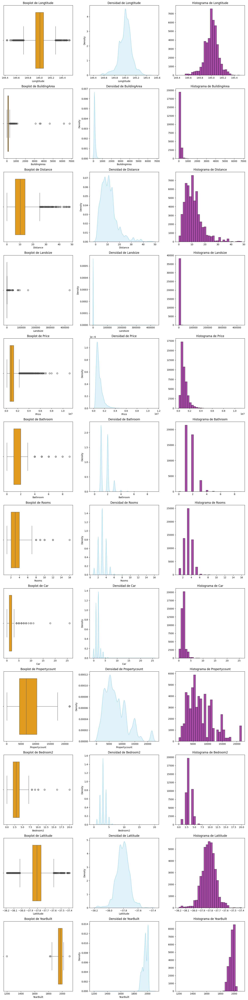

In [20]:
def plot_numerical_distributions(df):
    """Genera boxplots, histogramas y densidades para las variables numéricas."""
    
    num_cols = list(df.select_dtypes(include=["number"]).columns)
    n = len(num_cols)
    
    fig, axes = plt.subplots(nrows=n, ncols=3, figsize=(15, 5 * n))
    
    for i, col in enumerate(num_cols):
        # Boxplot
        sns.boxplot(x=df[col], ax=axes[i, 0], color="orange")
        axes[i, 0].set_title(f"Boxplot de {col}")

        # Density plot (histograma suavizado)
        sns.kdeplot(df[col], fill=True, ax=axes[i, 1], color="skyblue")
        axes[i, 1].set_title(f"Densidad de {col}")

        # Histograma
        axes[i, 2].hist(df[col].dropna(), bins=30, edgecolor="black", alpha=0.7, color="purple")
        axes[i, 2].set_title(f"Histograma de {col}")

    plt.tight_layout()
    plt.show()
plot_numerical_distributions(melbourne_df)

## Categorical Variables

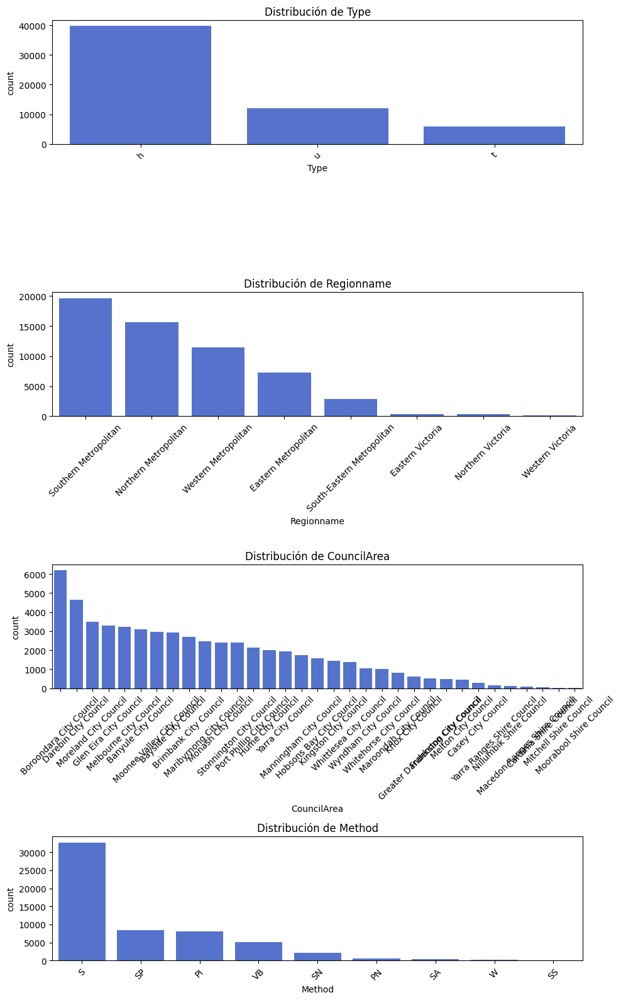

In [21]:

def plot_categorical_distributions(df):
    """Genera gráficos de barras para variables categóricas sin warnings, excluyendo ciertas columnas."""

    exclude_cols = ["SellerG", "Postcode", "Address", "Suburb"]
    cat_cols = [col for col in df.select_dtypes(include=["object", "category"]).columns if col not in exclude_cols]
    n = len(cat_cols)

    fig, axes = plt.subplots(nrows=n, ncols=1, figsize=(10, 4 * n))

    for i, col in enumerate(cat_cols):
        sns.countplot(x=df[col], ax=axes[i], order=df[col].value_counts().index, color="royalblue")
        axes[i].set_title(f"Distribución de {col}")
        axes[i].tick_params(axis="x", rotation=45)

    plt.tight_layout()
    plt.show()
plot_categorical_distributions(melbourne_df)

## Análisis Bivariable

### Target vs Numerical

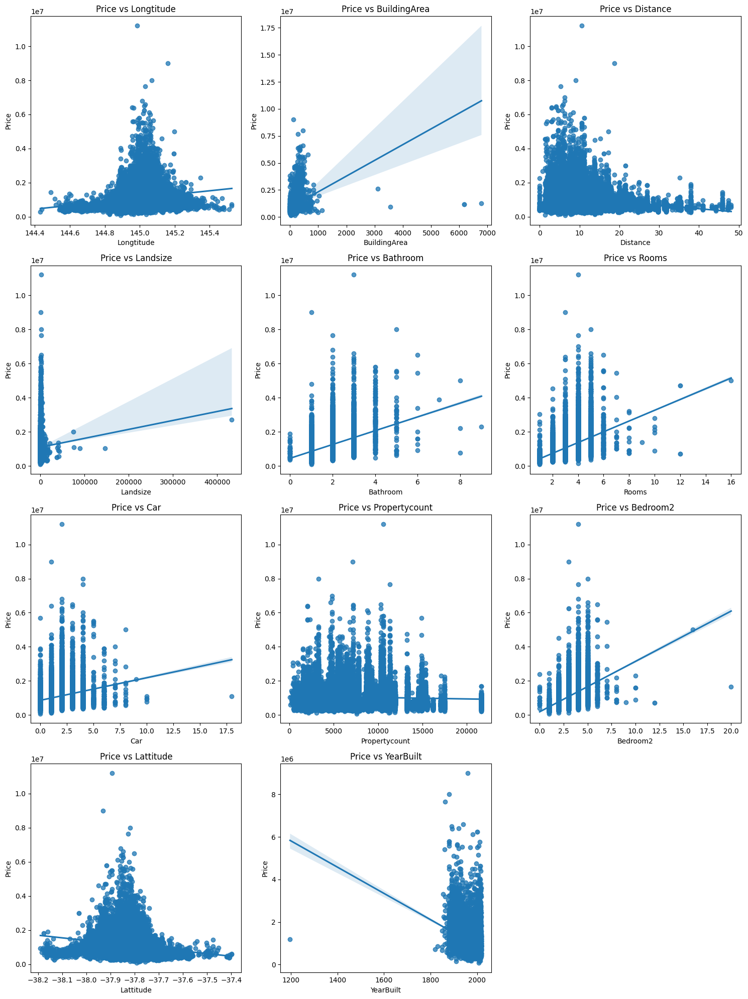

In [22]:
def analyze_bivariate_relationships(df, target="Price"):
    """Genera gráficos de dispersión con regresión para analizar relaciones con la variable objetivo."""

    num_cols = [col for col in df.select_dtypes(include=["number"]).columns if col != target]
    n = len(num_cols)

    fig, axes = plt.subplots(nrows=(n // 3) + 1, ncols=3, figsize=(15, 5 * ((n // 3) + 1)))
    axes = axes.flatten()

    for i, col in enumerate(num_cols):
        sns.regplot(data=df, x=col, y=target, ax=axes[i], scatter_kws={"alpha": 0.5})
        axes[i].set_title(f"{target} vs {col}")

    # Ocultar ejes vacíos si hay menos de 3 columnas
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Ejecutar con tus datos
analyze_bivariate_relationships(melbourne_df, target="Price")


### Matriz de correlaciones

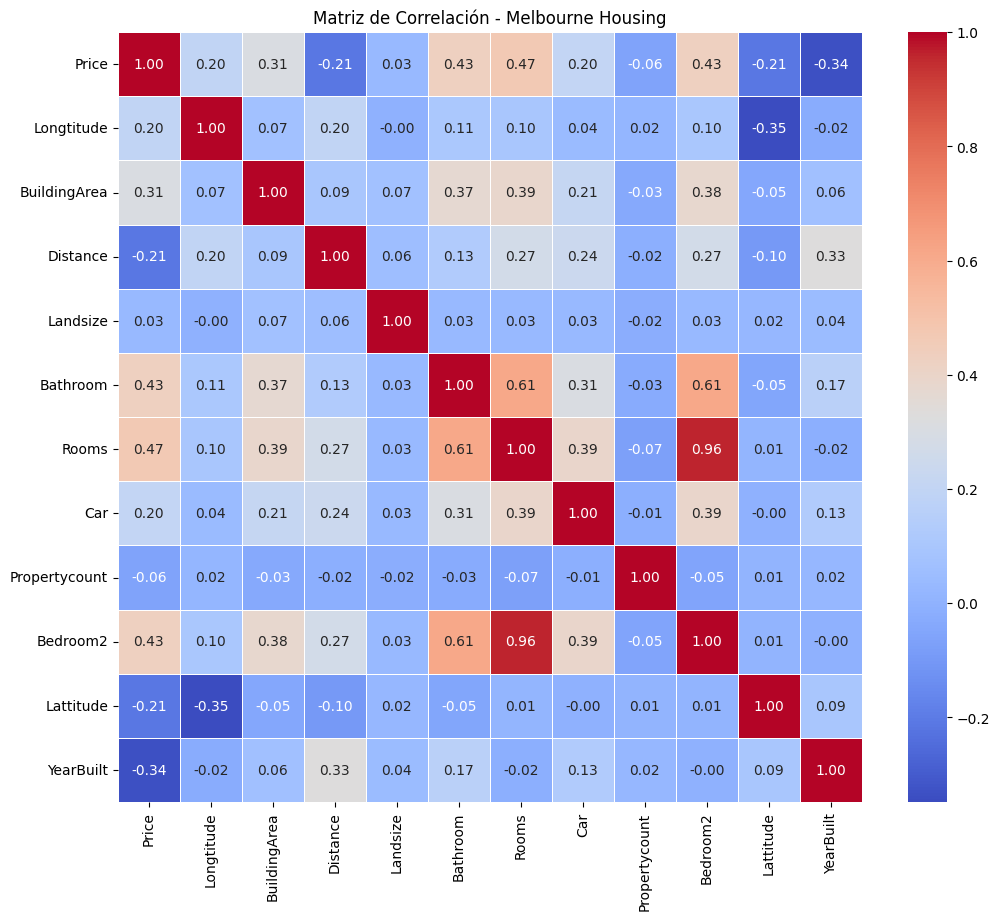

In [23]:
cols = melbourne_df.columns.tolist()
cols.insert(0, cols.pop(cols.index("Price")))  # Mueve "Price" a la primera posición
melbourne_df = melbourne_df.reindex(columns=cols)

# Calcular la matriz de correlación
melbourne_corr = melbourne_df.corr(numeric_only=True)

# Graficar la matriz de correlación
fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(melbourne_corr, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5, ax=ax)
plt.title("Matriz de Correlación - Melbourne Housing")
plt.show()

### Target vs Categorical

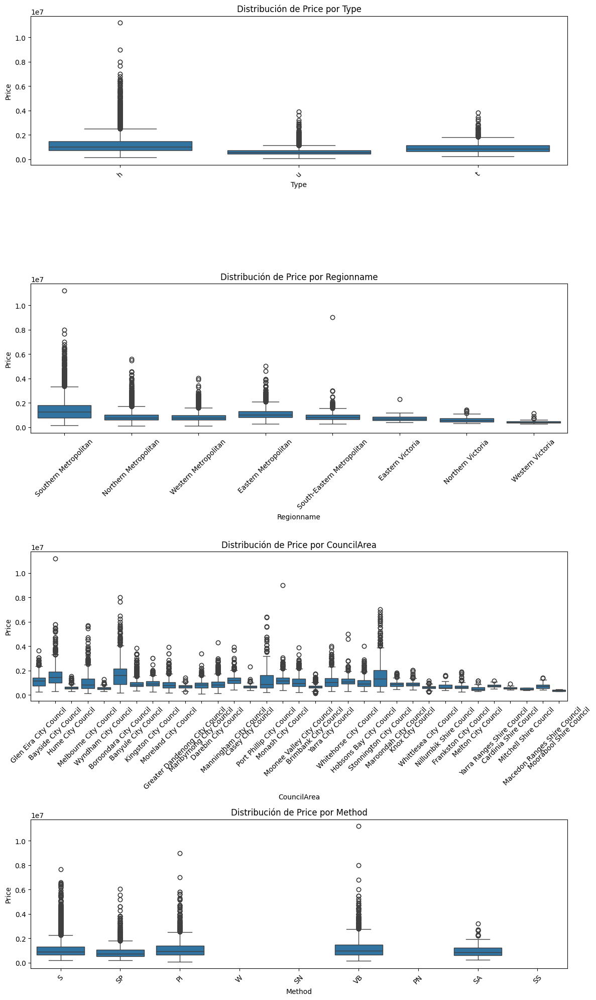

In [24]:

# Seleccionar columnas categóricas (excluyendo 'SellerG', 'Postcode', 'Address', 'Suburb') debido a que las vamos a eliminar
cat_cols = melbourne_df.select_dtypes(include=["object", "category"]).columns
cat_cols = [col for col in cat_cols if col not in ["SellerG", "Postcode", "Address", "Suburb"]]

# Graficar Boxplots
fig, axes = plt.subplots(nrows=len(cat_cols), ncols=1, figsize=(12, 5 * len(cat_cols)))

for i, col in enumerate(cat_cols):
    sns.boxplot(data=melbourne_df, x=col, y="Price", ax=axes[i])
    axes[i].set_title(f"Distribución de Price por {col}")
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.show()


## Numerical vs Numerical

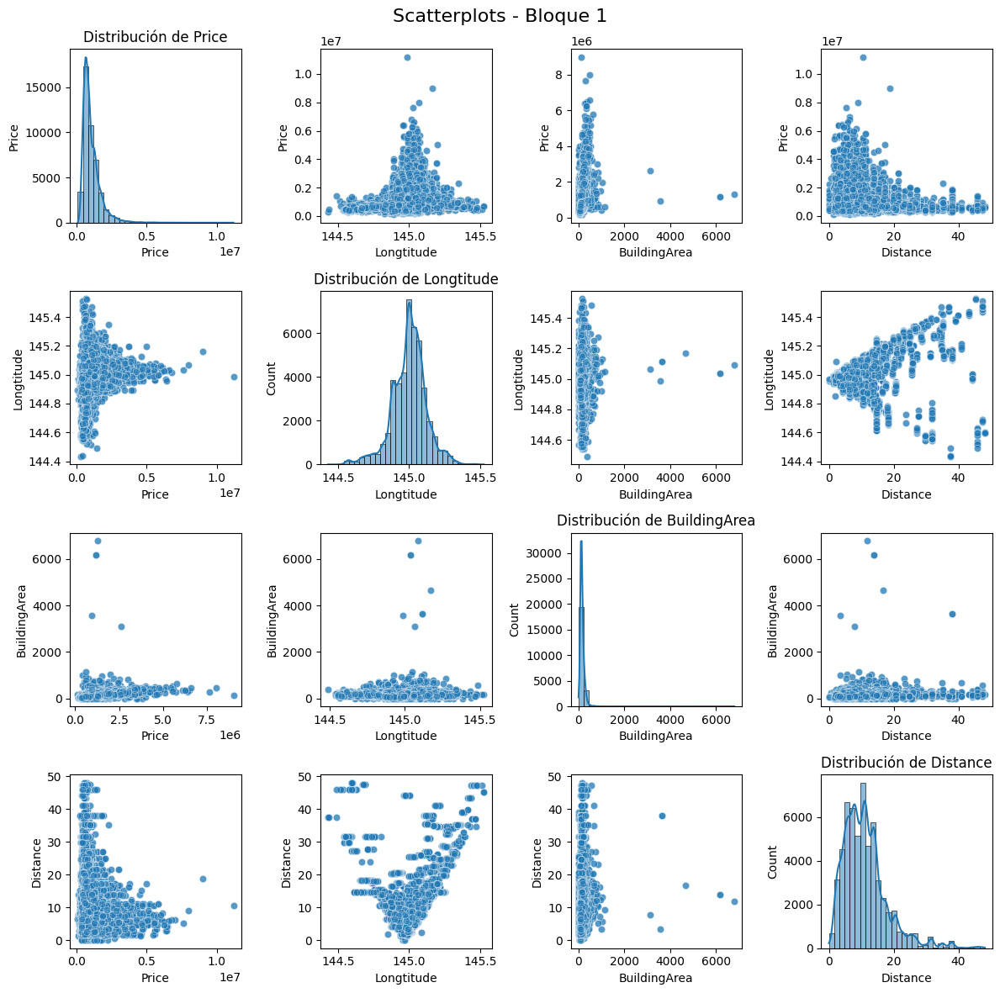

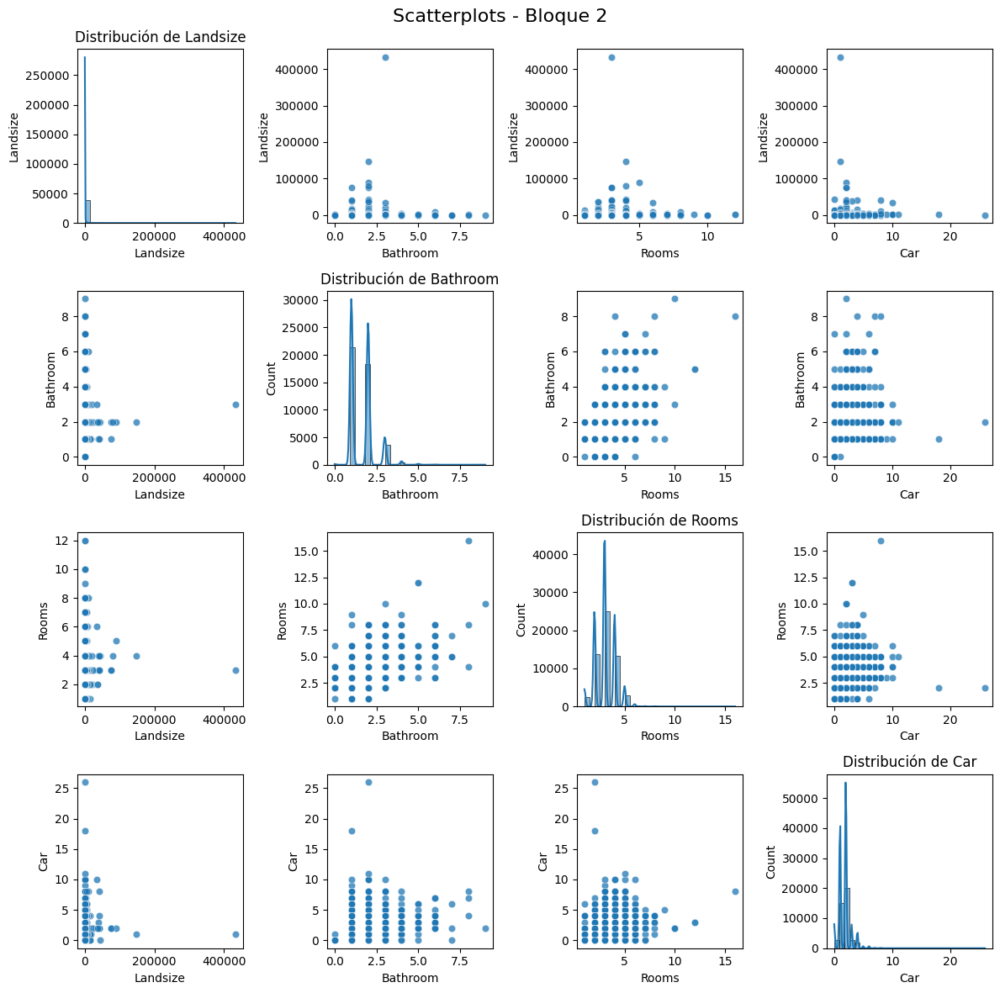

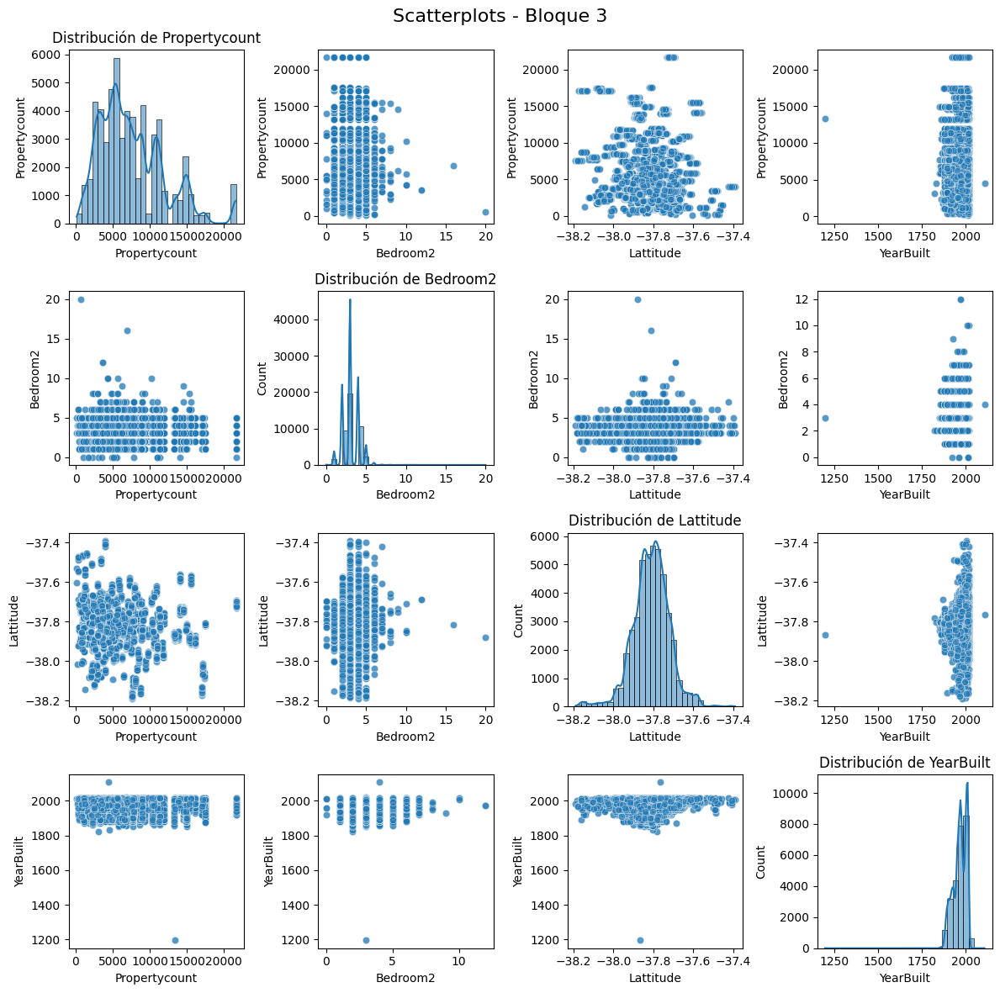

In [25]:
# Seleccionar solo las variables numéricas
num_cols = melbourne_df.select_dtypes(include="number").columns.tolist()
block_size = 4  
num_blocks = int(np.ceil(len(num_cols) / block_size))  # Cantidad de bloques

for b in range(num_blocks):
    subset = num_cols[b * block_size:(b + 1) * block_size]  # Extraer un subconjunto de variables
    num_vars = len(subset)

    fig, axes = plt.subplots(nrows=num_vars, ncols=num_vars, figsize=(3 * num_vars, 3 * num_vars))

    for i, col1 in enumerate(subset):
        for j, col2 in enumerate(subset):
            ax = axes[i, j] if num_vars > 1 else axes  # Manejo si hay solo una variable
            
            if i == j:
              
                sns.histplot(melbourne_df[col1], bins=30, kde=True, ax=ax)
                ax.set_title(f"Distribución de {col1}")
            else:
                
                sns.scatterplot(x=melbourne_df[col2], y=melbourne_df[col1], ax=ax, alpha=0.5)

            
            if j == 0:
                ax.set_ylabel(col1)
            if i == num_vars - 1:
                ax.set_xlabel(col2)

    plt.suptitle(f"Scatterplots - Bloque {b+1}", fontsize=16)
    plt.tight_layout()
    plt.show()
